# EDA + CenterNet Baseline

References:
* Took 3D visualization code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car
* CenterNet paper https://arxiv.org/pdf/1904.07850.pdf
* CenterNet repository https://github.com/xingyizhou/CenterNet

Change log:
* v14: better inference: added `optimize_xy` function | LB 0.093
* v15: horizontal flip augmentation | ERROR
* v16: faster training (made smaller padding) | LB 0.089
* v17: smaller image size and better image proportions | LB 0.066
* v18: image size back; changed flip probability; **new visualizations** | LB ?

# What is this competition about?
1. You are given the images taken from the roof of a car
    * ~4k training images
    * Always the same car and the same camera
2. You are asked to detect other cars on that image
    * There can be many cars
    * You need to predict their positions
![](https://i.ibb.co/7RJ2Wbs/results-33-2.png)

## What is in this notebook?
* Data distributions: 1D, 2D and 3D
* Functions to transform between camera coordinates and road coordinates
* Simple CenterNet baseline

## CenterNet
This architecture predicts centers of objects as a heatmap.  
It predicts sizes of the boxes as a regression task.  
![](https://github.com/xingyizhou/CenterNet/raw/master/readme/fig2.png)

It is also used for pose estimation:
![](https://raw.githubusercontent.com/xingyizhou/CenterNet/master/readme/pose3.png)
*(images from the [original repository](https://github.com/xingyizhou/CenterNet))*  
Coordinates of human joints are also predicted using regression.  

I use this idea to predict `x, y, z` coordinates of the vehicle and also `yaw, pitch_cos, pitch_sin, roll` angles.  
For `pitch` I predict sin and cos, because, as we will see, this angle can be both near 0 and near 3.14.  
These 7 parameters are my regression target variables instead of `shift_x, shift_y, size_x, size_y`.  

In [2]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import cv2
from tqdm import tqdm#_notebook as tqdm
import matplotlib.pyplot as plt
import seaborn as sns
from functools import reduce
import os
from scipy.optimize import minimize
import plotly.express as px

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_absolute_error, mean_squared_error

import torch
import torch.nn as nn
import torch.nn.functional as F
import torch.optim as optim
from torch.optim import lr_scheduler
from torch.utils.data import Dataset, DataLoader
from torchvision import models
from torchvision import transforms, utils

PATH = '../input/pku-autonomous-driving/'
os.listdir(PATH)

['car_models_json',
 'test_masks.zip',
 'test_images',
 'test_images.zip',
 'sample_submission.csv',
 'car_models',
 'train.csv',
 'camera.zip',
 'test_masks',
 'train_masks',
 'car_models_json.zip',
 'train_masks.zip',
 'train_images',
 'camera',
 'train_images.zip',
 'car_models.zip']

# Load data

In [3]:
train = pd.read_csv(PATH + 'train.csv')
test = pd.read_csv(PATH + 'sample_submission.csv')

# From camera.zip
camera_matrix = np.array([[2304.5479, 0,  1686.2379],
                          [0, 2305.8757, 1354.9849],
                          [0, 0, 1]], dtype=np.float32)
camera_matrix_inv = np.linalg.inv(camera_matrix)

train.head()

,ImageId,PredictionString
0,ID_8a6e65317,16 0.254839 -2.57534 -3.10256 7.96539 3.20066 ...
1,ID_337ddc495,66 0.163988 0.192169 -3.12112 -3.17424 6.55331...
2,ID_a381bf4d0,43 0.162877 0.00519276 -3.02676 2.1876 3.53427...
3,ID_7c4a3e0aa,43 0.126957 -3.04442 -3.10883 -14.738 24.6389 ...
4,ID_8b510fad6,37 0.16017 0.00862796 -3.0887 -3.04548 3.4977 ...


**ImageId** column contains names of images:

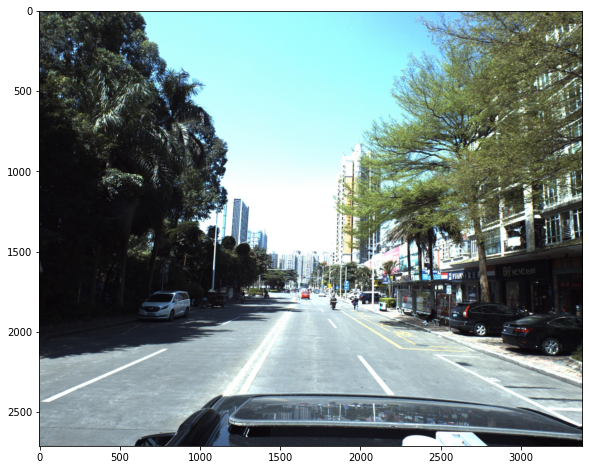

In [4]:
def imread(path, fast_mode=False):
    img = cv2.imread(path)
    if not fast_mode and img is not None and len(img.shape) == 3:
        img = np.array(img[:, :, ::-1])
    return img

img = imread(PATH + 'train_images/ID_8a6e65317' + '.jpg')
IMG_SHAPE = img.shape

plt.figure(figsize=(15,8))
plt.imshow(img);

**PredictionString** column contains pose information about all cars  

From the data description:
> The primary data is images of cars and related pose information. The pose information is formatted as strings, as follows:  
>
> `model type, yaw, pitch, roll, x, y, z`  
>
> A concrete example with two cars in the photo:  
>
> `5 0.5 0.5 0.5 0.0 0.0 0.0 32 0.25 0.25 0.25 0.5 0.4 0.7`  

We will need a function to extract these values:

In [5]:
def str2coords(s, names=['id', 'yaw', 'pitch', 'roll', 'x', 'y', 'z']):
    '''
    Input:
        s: PredictionString (e.g. from train dataframe)
        names: array of what to extract from the string
    Output:
        list of dicts with keys from `names`
    '''
    coords = []
    for l in np.array(s.split()).reshape([-1, 7]):
        coords.append(dict(zip(names, l.astype('float'))))
        if 'id' in coords[-1]:
            coords[-1]['id'] = int(coords[-1]['id'])
    return coords

In [6]:
inp = train['PredictionString'][0]
print('Example input:\n', inp)
print()
print('Output:\n', str2coords(inp))

Example input:
 16 0.254839 -2.57534 -3.10256 7.96539 3.20066 11.0225 56 0.181647 -1.46947 -3.12159 9.60332 4.66632 19.339 70 0.163072 -1.56865 -3.11754 10.39 11.2219 59.7825 70 0.141942 -3.1395 3.11969 -9.59236 5.13662 24.7337 46 0.163068 -2.08578 -3.11754 9.83335 13.2689 72.9323

Output:
 [{'id': 16, 'yaw': 0.254839, 'pitch': -2.57534, 'roll': -3.10256, 'x': 7.96539, 'y': 3.20066, 'z': 11.0225}, {'id': 56, 'yaw': 0.181647, 'pitch': -1.46947, 'roll': -3.12159, 'x': 9.60332, 'y': 4.66632, 'z': 19.339}, {'id': 70, 'yaw': 0.163072, 'pitch': -1.56865, 'roll': -3.11754, 'x': 10.39, 'y': 11.2219, 'z': 59.7825}, {'id': 70, 'yaw': 0.141942, 'pitch': -3.1395, 'roll': 3.11969, 'x': -9.59236, 'y': 5.13662, 'z': 24.7337}, {'id': 46, 'yaw': 0.163068, 'pitch': -2.08578, 'roll': -3.11754, 'x': 9.83335, 'y': 13.2689, 'z': 72.9323}]


# Data distributions

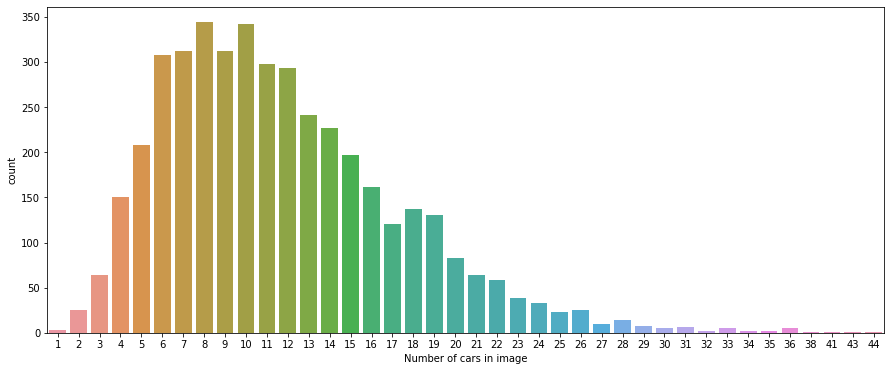

In [7]:
lens = [len(str2coords(s)) for s in train['PredictionString']]

plt.figure(figsize=(15,6))
sns.countplot(lens);
plt.xlabel('Number of cars in image');

DataFrame of all points

In [8]:
points_df = pd.DataFrame()
for col in ['x', 'y', 'z', 'yaw', 'pitch', 'roll']:
    arr = []
    for ps in train['PredictionString']:
        coords = str2coords(ps)
        arr += [c[col] for c in coords]
    points_df[col] = arr

print('len(points_df)', len(points_df))
points_df.head()

len(points_df) 49684


,x,y,z,yaw,pitch,roll
0,7.96539,3.20066,11.0225,0.254839,-2.57534,-3.10256
1,9.60332,4.66632,19.3390,0.181647,-1.46947,-3.12159
2,10.39000,11.22190,59.7825,0.163072,-1.56865,-3.11754
3,-9.59236,5.13662,24.7337,0.141942,-3.13950,3.11969
4,9.83335,13.26890,72.9323,0.163068,-2.08578,-3.11754


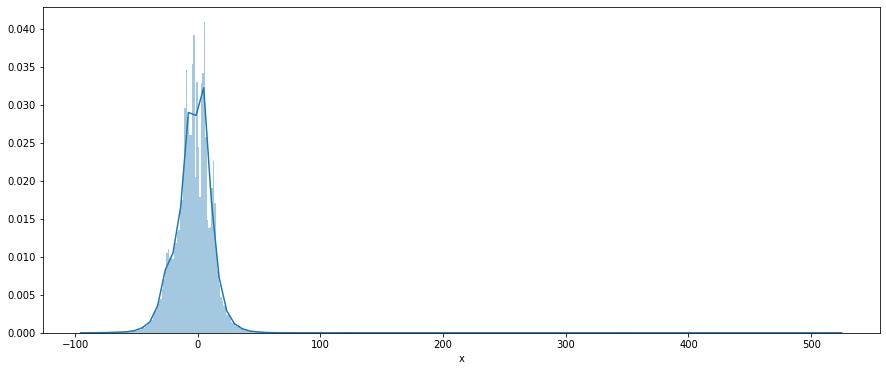

In [9]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['x'], bins=500);
plt.xlabel('x')
plt.show()

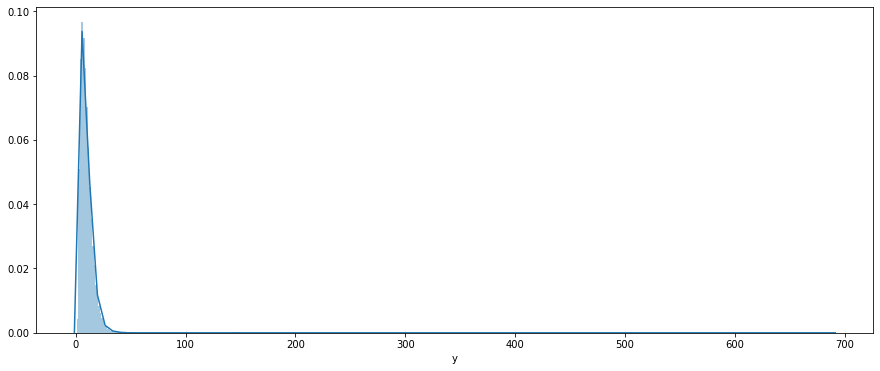

In [10]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['y'], bins=500);
plt.xlabel('y')
plt.show()

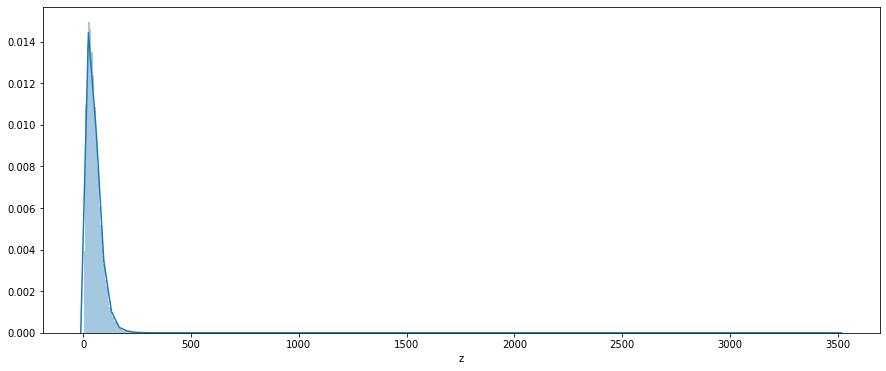

In [11]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['z'], bins=500);
plt.xlabel('z')
plt.show()

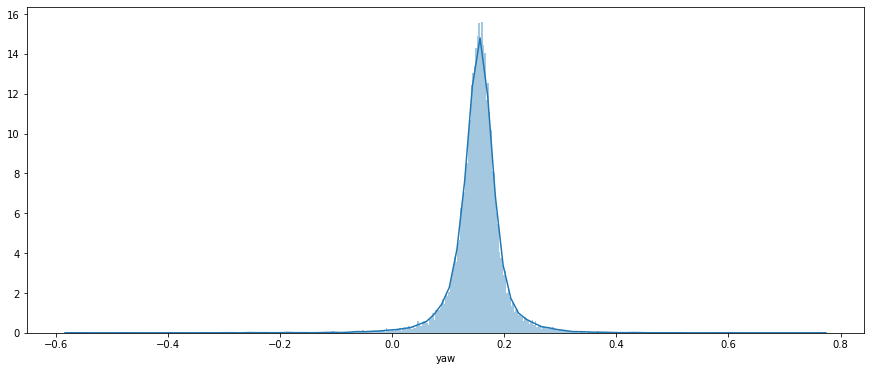

In [12]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['yaw'], bins=500);
plt.xlabel('yaw')
plt.show()

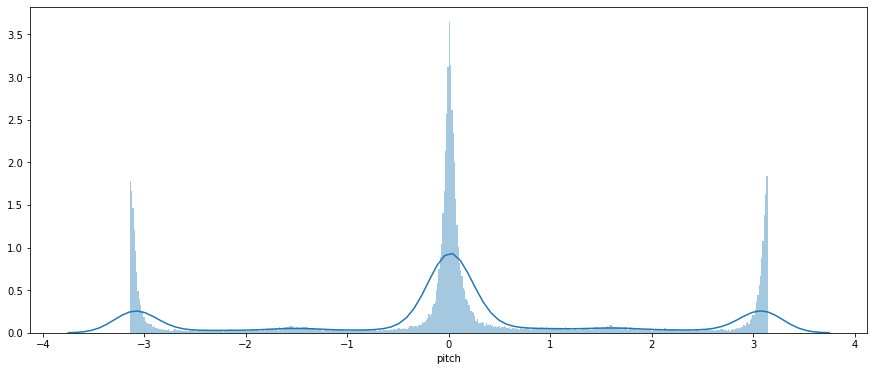

In [13]:
plt.figure(figsize=(15,6))
sns.distplot(points_df['pitch'], bins=500);
plt.xlabel('pitch')
plt.show()

I guess, pitch and yaw are mixed up in this dataset. Pitch cannot be that big. That would mean that cars are upside down.

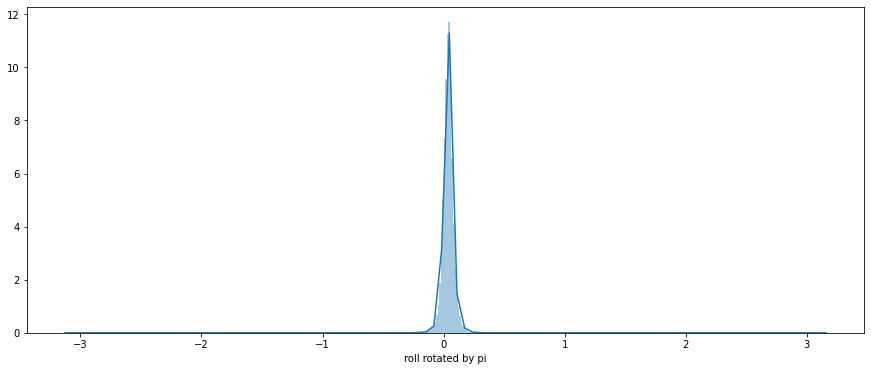

In [14]:
def rotate(x, angle):
    x = x + angle
    x = x - (x + np.pi) // (2 * np.pi) * 2 * np.pi
    return x

plt.figure(figsize=(15,6))
sns.distplot(points_df['roll'].map(lambda x: rotate(x, np.pi)), bins=500);
plt.xlabel('roll rotated by pi')
plt.show()

# 2D Visualization

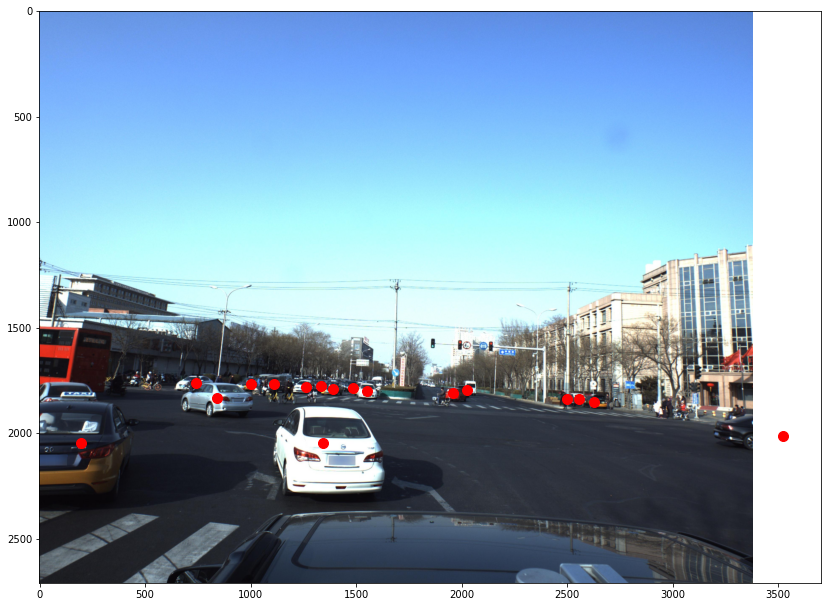

In [15]:
def get_img_coords(s):
    '''
    Input is a PredictionString (e.g. from train dataframe)
    Output is two arrays:
        xs: x coordinates in the image (row)
        ys: y coordinates in the image (column)
    '''
    coords = str2coords(s)
    xs = [c['x'] for c in coords]
    ys = [c['y'] for c in coords]
    zs = [c['z'] for c in coords]
    P = np.array(list(zip(xs, ys, zs))).T
    img_p = np.dot(camera_matrix, P).T
    img_p[:, 0] /= img_p[:, 2]
    img_p[:, 1] /= img_p[:, 2]
    img_xs = img_p[:, 0]
    img_ys = img_p[:, 1]
    img_zs = img_p[:, 2] # z = Distance from the camera
    return img_xs, img_ys

plt.figure(figsize=(14,14))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'))
plt.scatter(*get_img_coords(train['PredictionString'][2217]), color='red', s=100);

In [16]:
get_img_coords(train['PredictionString'][2217])

(array([1342.26065361,  197.46346809,  839.56272175, 1001.0426293 ,
        1262.39145243, 1391.57970039, 1483.36560757, 1553.00925211,
        1960.37793223, 2629.17847349,  740.32781577, 1112.41437294,
        1333.64162849, 2028.2313057 , 3525.84692769, 2556.78534902,
        2501.23460537]),
 array([2047.43677034, 2048.87596234, 1832.65295796, 1767.18786411,
        1780.29693083, 1790.81895436, 1784.3027872 , 1799.43228538,
        1810.7453985 , 1851.705165  , 1760.6374862 , 1769.10218333,
        1774.74141317, 1794.60763452, 2015.72498696, 1840.06663994,
        1838.16889062]))

One point is out of image!

Let's look at the distribution of all points. Image is here just for reference.

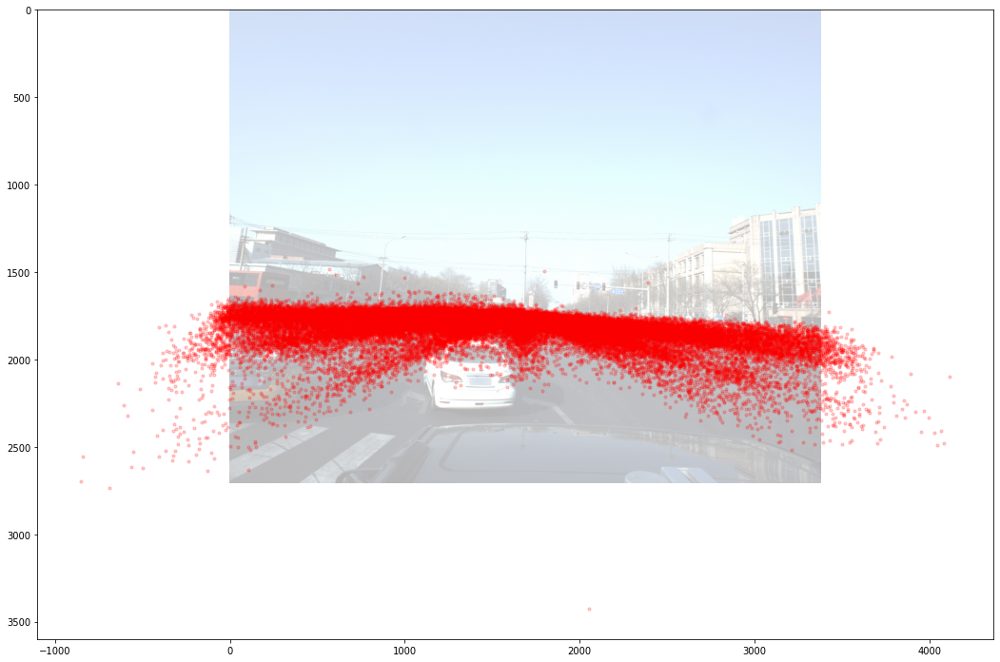

In [17]:
xs, ys = [], []

for ps in train['PredictionString']:
    x, y = get_img_coords(ps)
    xs += list(x)
    ys += list(y)

plt.figure(figsize=(18,18))
plt.imshow(imread(PATH + 'train_images/' + train['ImageId'][2217] + '.jpg'), alpha=0.3)
plt.scatter(xs, ys, color='red', s=10, alpha=0.2);

Many points are outside!

Let's look at this distribution "from the sky"

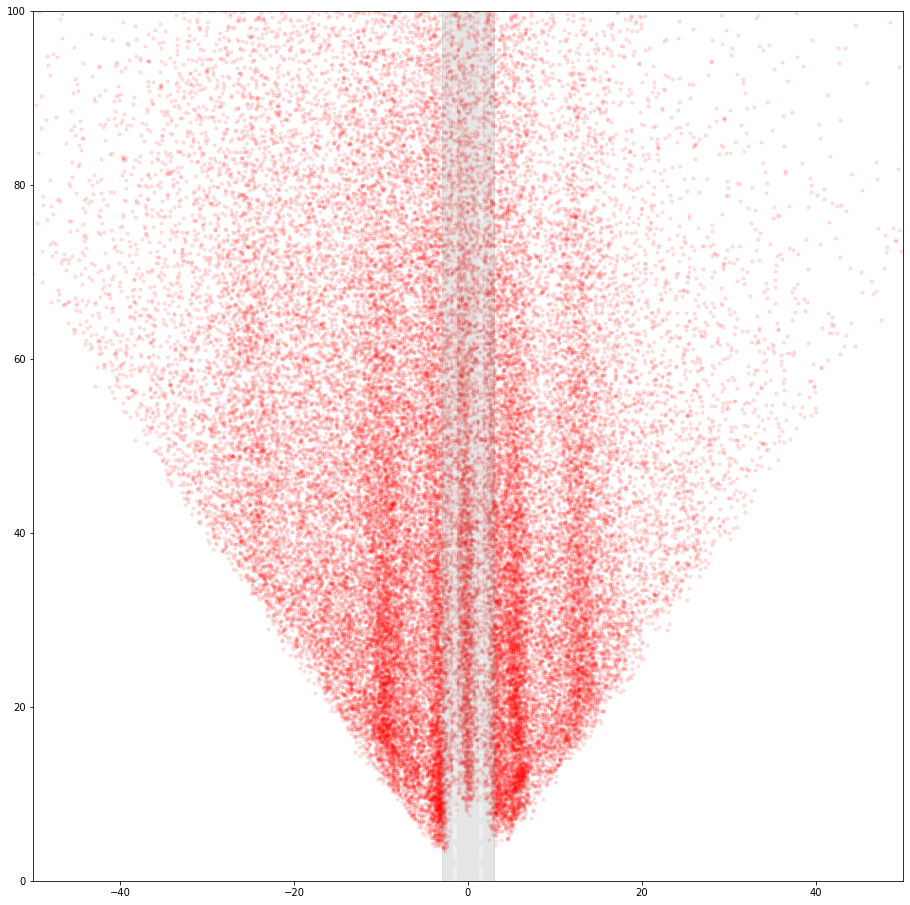

In [18]:
# Road points
road_width = 3
road_xs = [-road_width, road_width, road_width, -road_width, -road_width]
road_ys = [0, 0, 500, 500, 0]

plt.figure(figsize=(16,16))
plt.axes().set_aspect(1)
plt.xlim(-50,50)
plt.ylim(0,100)

# View road
plt.fill(road_xs, road_ys, alpha=0.2, color='gray')
plt.plot([road_width/2,road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
plt.plot([-road_width/2,-road_width/2], [0,100], alpha=0.4, linewidth=4, color='white', ls='--')
# View cars
plt.scatter(points_df['x'], np.sqrt(points_df['z']**2 + points_df['y']**2), color='red', s=10, alpha=0.1);

3d distribution of points:

In [19]:
fig = px.scatter_3d(points_df, x='x', y='y', z='z',color='pitch', range_x=(-50,50), range_y=(0,50), range_z=(0,250), opacity=0.1)
fig.show()

1) `x` is measured from left to right  
2) I thought that `y` is the distance from the car and `z` is height above the road. Looks like this is not the case.  

Let's look how good these points lay in one plane  
Try to predict `y` knowing `x, z`:

In [20]:
zy_slope = LinearRegression()
X = points_df[['z']]
y = points_df['y']
zy_slope.fit(X, y)
print('MAE without x:', mean_absolute_error(y, zy_slope.predict(X)))

# Will use this model later
xzy_slope = LinearRegression()
X = points_df[['x', 'z']]
y = points_df['y']
xzy_slope.fit(X, y)
print('MAE with x:', mean_absolute_error(y, xzy_slope.predict(X)))

print('\ndy/dx = {:.3f}\ndy/dz = {:.3f}'.format(*xzy_slope.coef_))

MAE without x: 0.6553782352986705
MAE with x: 0.44816612890041335

dy/dx = 0.051
dy/dz = 0.169


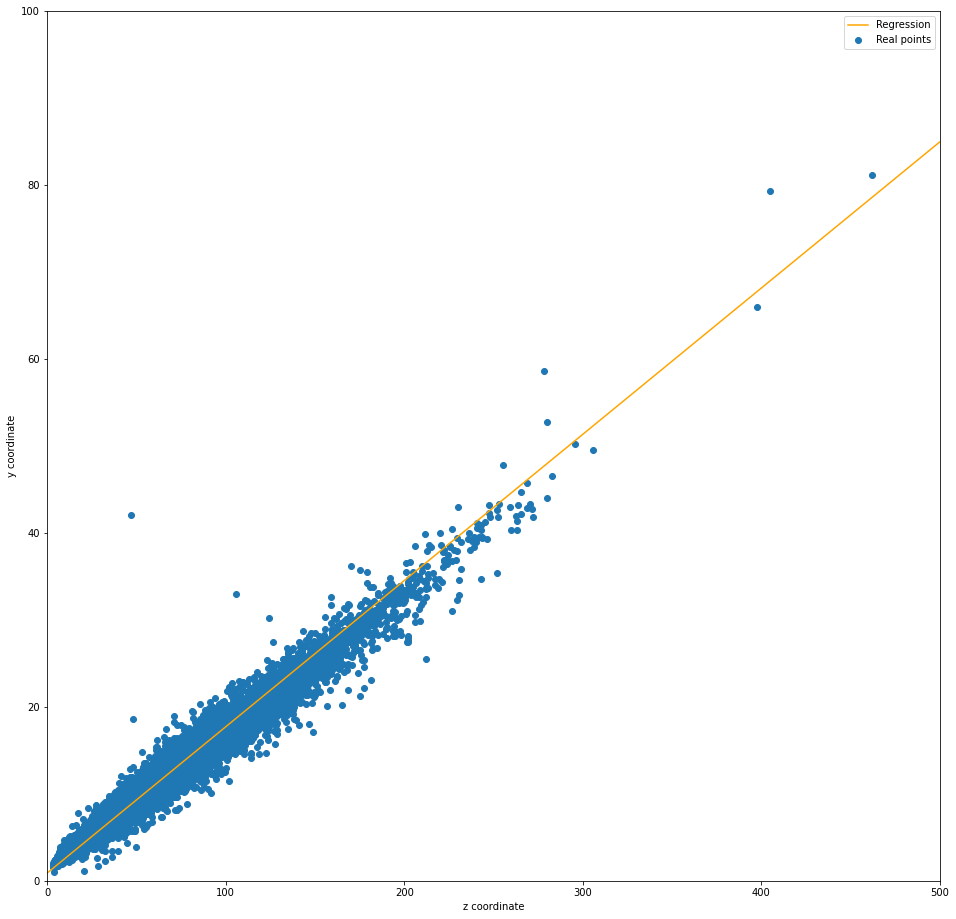

In [21]:
plt.figure(figsize=(16,16))
plt.xlim(0,500)
plt.ylim(0,100)
plt.scatter(points_df['z'], points_df['y'], label='Real points')
X_line = np.linspace(0,500, 10)
plt.plot(X_line, zy_slope.predict(X_line.reshape(-1, 1)), color='orange', label='Regression')
plt.legend()
plt.xlabel('z coordinate')
plt.ylabel('y coordinate');

In [22]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
#sns.pairplot(points_df.loc[:1000], hue='yaw')

# 3D Visualization
Used code from https://www.kaggle.com/zstusnoopy/visualize-the-location-and-3d-bounding-box-of-car, but made it one function

In [23]:
from math import sin, cos

# convert euler angle to rotation matrix
def euler_to_Rot(yaw, pitch, roll):
    Y = np.array([[cos(yaw), 0, sin(yaw)],
                  [0, 1, 0],
                  [-sin(yaw), 0, cos(yaw)]])
    P = np.array([[1, 0, 0],
                  [0, cos(pitch), -sin(pitch)],
                  [0, sin(pitch), cos(pitch)]])
    R = np.array([[cos(roll), -sin(roll), 0],
                  [sin(roll), cos(roll), 0],
                  [0, 0, 1]])
    return np.dot(Y, np.dot(P, R))

In [24]:
def draw_line(image, points):
    color = (255, 0, 0)
    cv2.line(image, tuple(points[0][:2]), tuple(points[3][:2]), color, 16)
    cv2.line(image, tuple(points[0][:2]), tuple(points[1][:2]), color, 16)
    cv2.line(image, tuple(points[1][:2]), tuple(points[2][:2]), color, 16)
    cv2.line(image, tuple(points[2][:2]), tuple(points[3][:2]), color, 16)
    return image


def draw_points(image, points):
    for (p_x, p_y, p_z) in points:
        cv2.circle(image, (p_x, p_y), int(1000 / p_z), (0, 255, 0), -1)
#         if p_x > image.shape[1] or p_y > image.shape[0]:
#             print('Point', p_x, p_y, 'is out of image with shape', image.shape)
    return image

In [25]:
def visualize(img, coords):
    # You will also need functions from the previous cells
    x_l = 1.02
    y_l = 0.80
    z_l = 2.31
    
    img = img.copy()
    for point in coords:
        # Get values
        x, y, z = point['x'], point['y'], point['z']
        yaw, pitch, roll = -point['pitch'], -point['yaw'], -point['roll']
        # Math
        Rt = np.eye(4)
        t = np.array([x, y, z])
        Rt[:3, 3] = t
        Rt[:3, :3] = euler_to_Rot(yaw, pitch, roll).T
        Rt = Rt[:3, :]
        P = np.array([[x_l, -y_l, -z_l, 1],
                      [x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, z_l, 1],
                      [-x_l, -y_l, -z_l, 1],
                      [0, 0, 0, 1]]).T
        img_cor_points = np.dot(camera_matrix, np.dot(Rt, P))
        img_cor_points = img_cor_points.T
        img_cor_points[:, 0] /= img_cor_points[:, 2]
        img_cor_points[:, 1] /= img_cor_points[:, 2]
        img_cor_points = img_cor_points.astype(int)
        # Drawing
        img = draw_line(img, img_cor_points)
        img = draw_points(img, img_cor_points[-1:])
    
    return img

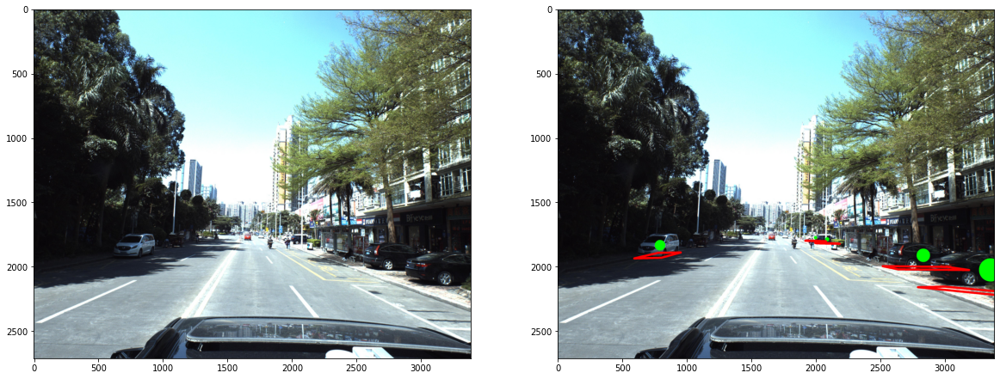

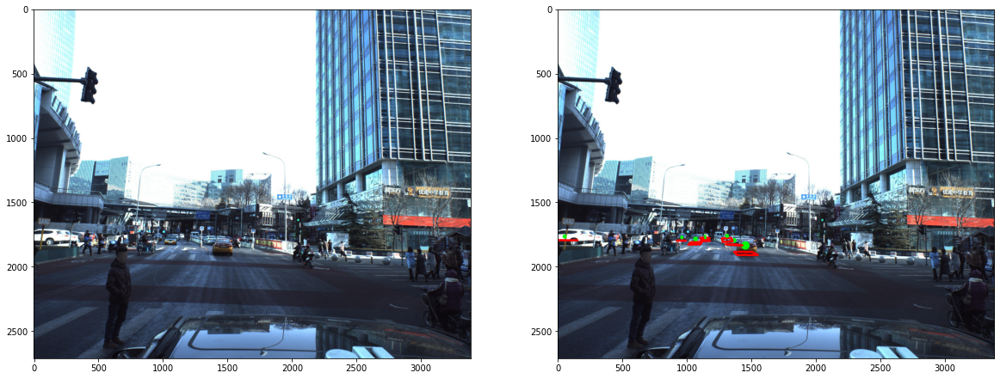

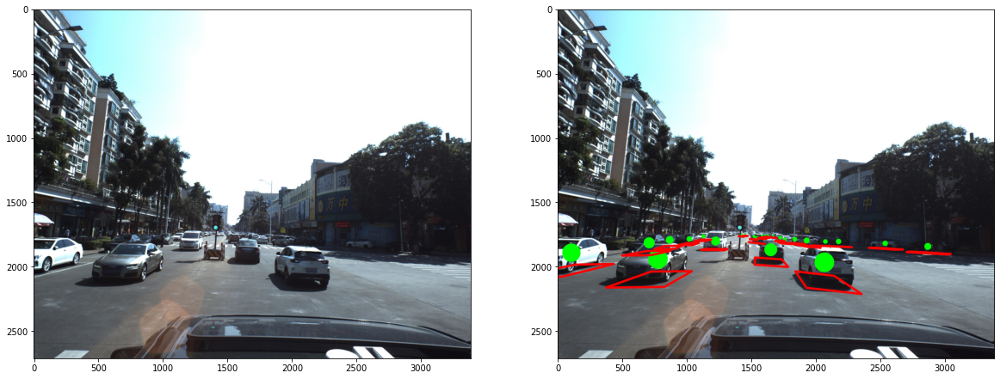

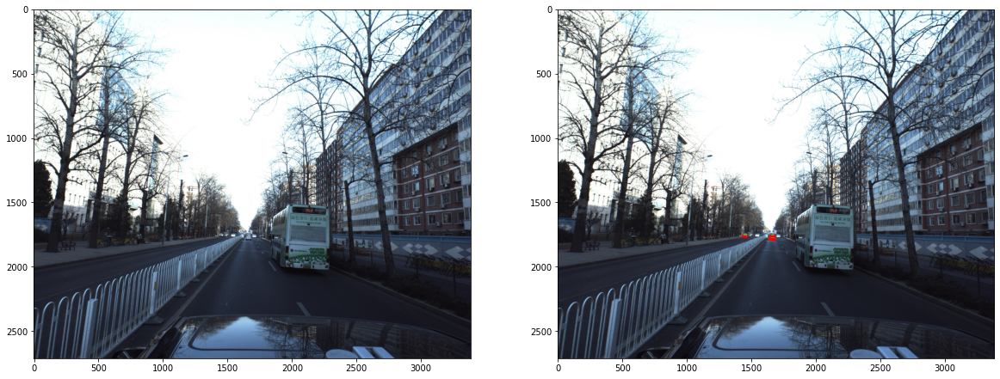

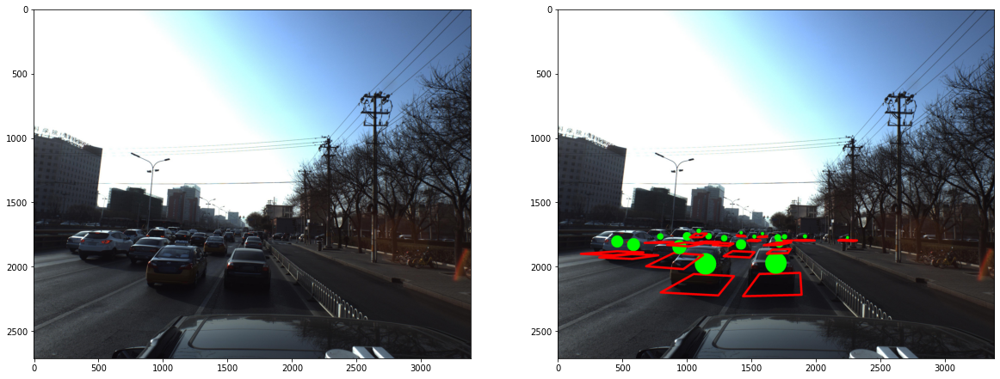

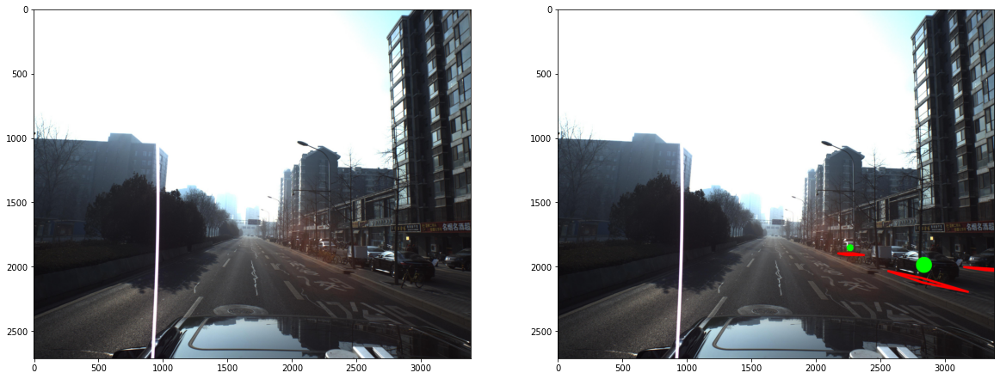

In [26]:
n_rows = 6

for idx in range(n_rows):
    fig, axes = plt.subplots(1, 2, figsize=(20,20))
    img = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
    axes[0].imshow(img)
    img_vis = visualize(img, str2coords(train['PredictionString'].iloc[idx]))
    axes[1].imshow(img_vis)
    plt.show()

# Image preprocessing

In [27]:
IMG_WIDTH = 1024
IMG_HEIGHT = IMG_WIDTH // 16 * 5
MODEL_SCALE = 8

def _regr_preprocess(regr_dict, flip=False):
    if flip:
        for k in ['x', 'pitch', 'roll']:
            regr_dict[k] = -regr_dict[k]
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] / 100
    regr_dict['roll'] = rotate(regr_dict['roll'], np.pi)
    regr_dict['pitch_sin'] = sin(regr_dict['pitch'])
    regr_dict['pitch_cos'] = cos(regr_dict['pitch'])
    regr_dict.pop('pitch')
    regr_dict.pop('id')
    return regr_dict

def _regr_back(regr_dict):
    for name in ['x', 'y', 'z']:
        regr_dict[name] = regr_dict[name] * 100
    regr_dict['roll'] = rotate(regr_dict['roll'], -np.pi)
    
    pitch_sin = regr_dict['pitch_sin'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    pitch_cos = regr_dict['pitch_cos'] / np.sqrt(regr_dict['pitch_sin']**2 + regr_dict['pitch_cos']**2)
    regr_dict['pitch'] = np.arccos(pitch_cos) * np.sign(pitch_sin)
    return regr_dict

def preprocess_image(img, flip=False):
    img = img[img.shape[0] // 2:]
    bg = np.ones_like(img) * img.mean(1, keepdims=True).astype(img.dtype)
    bg = bg[:, :img.shape[1] // 6]
    img = np.concatenate([bg, img, bg], 1)
    img = cv2.resize(img, (IMG_WIDTH, IMG_HEIGHT))
    if flip:
        img = img[:,::-1]
    return (img / 255).astype('float32')

def get_mask_and_regr(img, labels, flip=False):
    mask = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE], dtype='float32')
    regr_names = ['x', 'y', 'z', 'yaw', 'pitch', 'roll']
    regr = np.zeros([IMG_HEIGHT // MODEL_SCALE, IMG_WIDTH // MODEL_SCALE, 7], dtype='float32')
    coords = str2coords(labels)
    xs, ys = get_img_coords(labels)
    for x, y, regr_dict in zip(xs, ys, coords):
        x, y = y, x
        x = (x - img.shape[0] // 2) * IMG_HEIGHT / (img.shape[0] // 2) / MODEL_SCALE
        x = np.round(x).astype('int')
        y = (y + img.shape[1] // 6) * IMG_WIDTH / (img.shape[1] * 4/3) / MODEL_SCALE
        y = np.round(y).astype('int')
        if x >= 0 and x < IMG_HEIGHT // MODEL_SCALE and y >= 0 and y < IMG_WIDTH // MODEL_SCALE:
            mask[x, y] = 1
            regr_dict = _regr_preprocess(regr_dict, flip)
            regr[x, y] = [regr_dict[n] for n in sorted(regr_dict)]
    if flip:
        mask = np.array(mask[:,::-1])
        regr = np.array(regr[:,::-1])
    return mask, regr

img.shape (320, 1024, 3) std: 0.29819912
mask.shape (40, 128) std: 0.031234737
regr.shape (40, 128, 7) std: 0.013211883


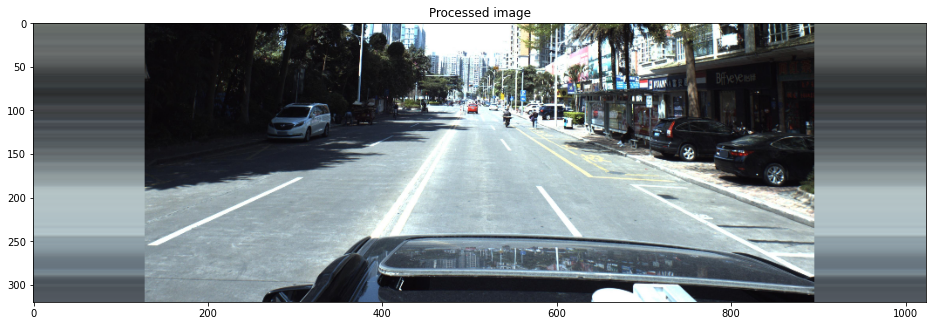

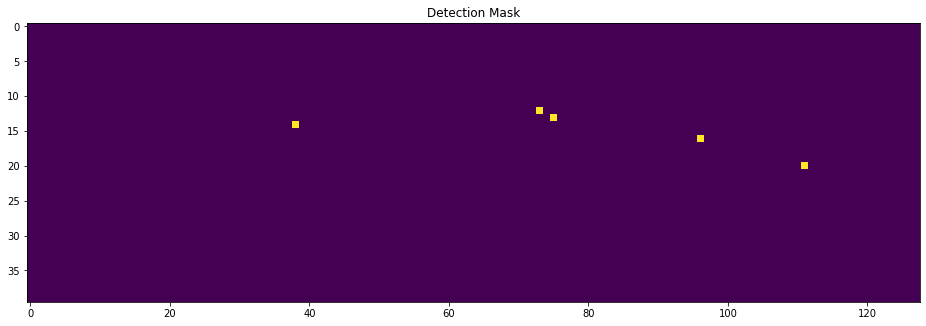

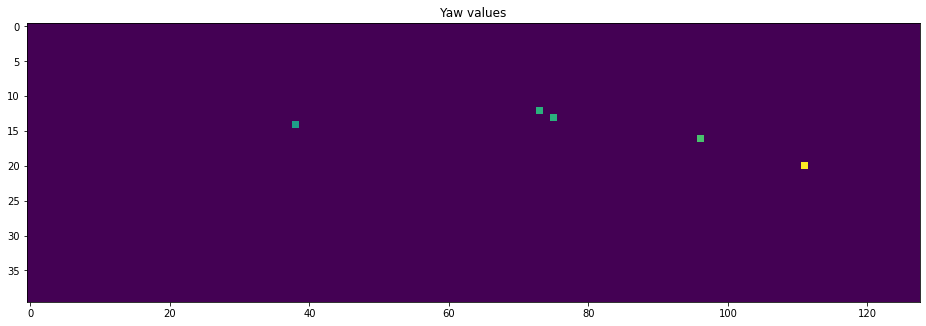

In [28]:
img0 = imread(PATH + 'train_images/' + train['ImageId'][0] + '.jpg')
img = preprocess_image(img0)

mask, regr = get_mask_and_regr(img0, train['PredictionString'][0])

print('img.shape', img.shape, 'std:', np.std(img))
print('mask.shape', mask.shape, 'std:', np.std(mask))
print('regr.shape', regr.shape, 'std:', np.std(regr))

plt.figure(figsize=(16,16))
plt.title('Processed image')
plt.imshow(img)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Detection Mask')
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.title('Yaw values')
plt.imshow(regr[:,:,-2])
plt.show()

Define functions to convert back from 2d map to 3d coordinates and angles

In [29]:
def distance_fn(xyz):
    x, y, z = xyz
    xx = -x if False else x
    slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
    x, y = convert_3d_to_2d(x, y, z)
    y, x = x, y
    #print("x,y,IMG_SHAPE[0], IMG_HEIGHT, MODEL_SCALE:",x,y,IMG_SHAPE[0], IMG_HEIGHT, MODEL_SCALE)

    x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
    y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
    return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)

In [30]:
DISTANCE_THRESH_CLEAR = 2

def convert_3d_to_2d(x, y, z, fx = 2304.5479, fy = 2305.8757, cx = 1686.2379, cy = 1354.9849):
    # stolen from https://www.kaggle.com/theshockwaverider/eda-visualization-baseline
    return x * fx / z + cx, y * fy / z + cy

def optimize_xy(r, c, x0, y0, z0, flipped=False):
    def distance_fn(xyz):
        x, y, z = xyz
        xx = -x if flipped else x
        slope_err = (xzy_slope.predict([[xx,z]])[0] - y)**2
        x, y = convert_3d_to_2d(x, y, z)
        y, x = x, y
        
        x = (x - IMG_SHAPE[0] // 2) * IMG_HEIGHT / (IMG_SHAPE[0] // 2) / MODEL_SCALE
        y = (y + IMG_SHAPE[1] // 6) * IMG_WIDTH / (IMG_SHAPE[1] * 4 / 3) / MODEL_SCALE
        return max(0.2, (x-r)**2 + (y-c)**2) + max(0.4, slope_err)
    
    res = minimize(distance_fn, [x0, y0, z0], method='Powell')
    x_new, y_new, z_new = res.x
    return x_new, y_new, z_new

def clear_duplicates(coords):
    for c1 in coords:
        xyz1 = np.array([c1['x'], c1['y'], c1['z']])
        for c2 in coords:
            xyz2 = np.array([c2['x'], c2['y'], c2['z']])
            distance = np.sqrt(((xyz1 - xyz2)**2).sum())
            if distance < DISTANCE_THRESH_CLEAR:
                if c1['confidence'] < c2['confidence']:
                    c1['confidence'] = -1
    return [c for c in coords if c['confidence'] > 0]

def extract_coords(prediction, flipped=False):
    logits = peak(prediction[0],-2.5)
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
    coords = clear_duplicates(coords)
    return coords

def coords2str(coords, names=['yaw', 'pitch', 'roll', 'x', 'y', 'z', 'confidence']):
    s = []
    for c in coords:
        for n in names:
            s.append(str(c.get(n, 0)))
    return ' '.join(s)

Ensure that all the forward and back transformations work consistently

In [29]:
# for idx in range(2):
#     fig, axes = plt.subplots(1, 2, figsize=(20,20))
    
#     for ax_i in range(2):
#         img0 = imread(PATH + 'train_images/' + train['ImageId'].iloc[idx] + '.jpg')
#         if ax_i == 1:
#             img0 = img0[:,::-1]
#         img = preprocess_image(img0, ax_i==1)
#         mask, regr = get_mask_and_regr(img0, train['PredictionString'][idx], ax_i==1)
#         regr = np.rollaxis(regr, 2, 0)
#         coords = extract_coords(np.concatenate([mask[None], regr], 0), ax_i==1)
        
#         axes[ax_i].set_title('Flip = {}'.format(ax_i==1))
#         axes[ax_i].imshow(visualize(img0, coords))
#     plt.show()

# PyTorch Dataset

In [31]:
class CarDataset(Dataset):
    """Car dataset."""

    def __init__(self, dataframe, root_dir, training=True, transform=None):
        self.df = dataframe
        self.root_dir = root_dir
        self.transform = transform
        self.training = training

    def __len__(self):
        return len(self.df)

    def __getitem__(self, idx):
        if torch.is_tensor(idx):
            idx = idx.tolist()
        
        # Get image name
        idx, labels = self.df.values[idx]
        img_name = self.root_dir.format(idx)
        
        # Augmentation
        flip = False
        #if self.training:
        #    flip = np.random.randint(10) == 1
        
        # Read image
        img0 = imread(img_name, True)
        img = preprocess_image(img0, flip=flip)
        img = np.rollaxis(img, 2, 0)
        
        # Get mask and regression maps
        mask, regr = get_mask_and_regr(img0, labels, flip=flip)
        regr = np.rollaxis(regr, 2, 0)
        
        return [img, mask, regr]

In [32]:
train_images_dir = PATH + 'train_images/{}.jpg'
test_images_dir = PATH + 'test_images/{}.jpg'

df_train, df_dev = train_test_split(train, test_size=0.01, random_state=42)
df_test = test

# Create dataset objects
train_dataset = CarDataset(df_train, train_images_dir, training=True)
dev_dataset = CarDataset(df_dev, train_images_dir, training=False)
test_dataset = CarDataset(df_test, test_images_dir, training=False)

Show some generated examples

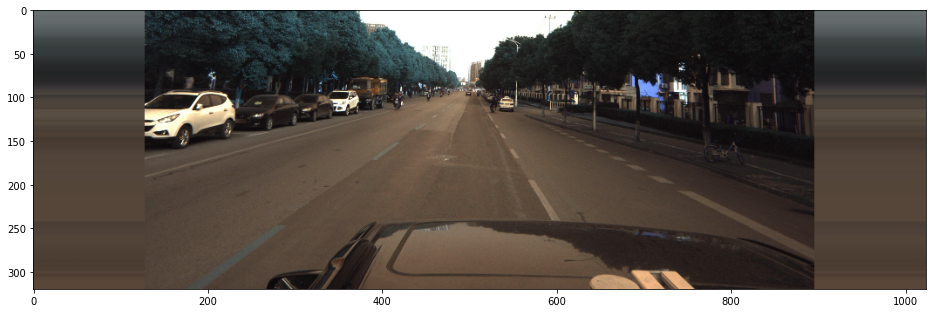

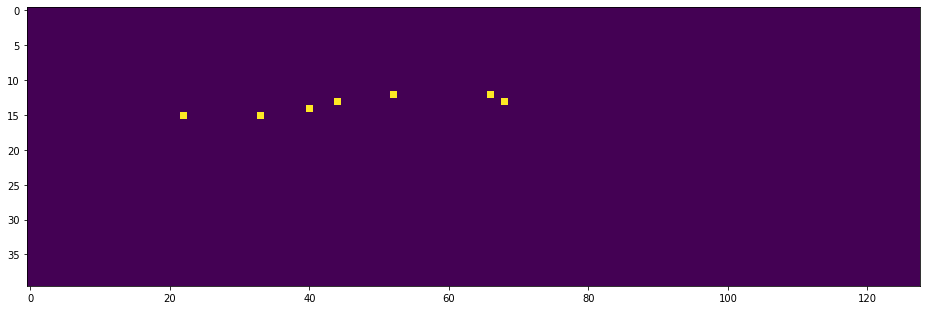

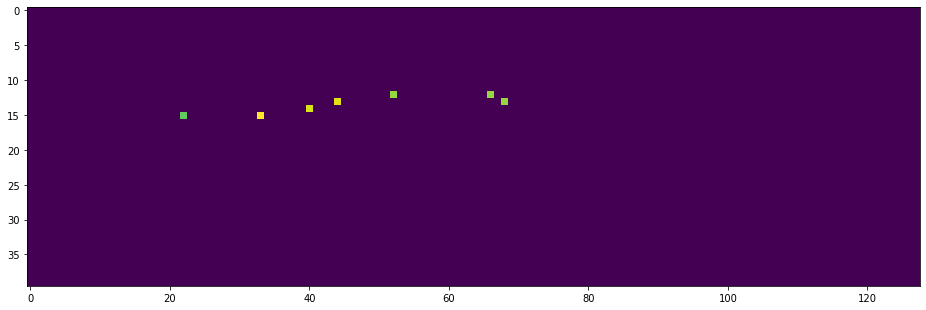

In [33]:
img, mask, regr = train_dataset[0]

plt.figure(figsize=(16,16))
plt.imshow(np.rollaxis(img, 0, 3))
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(mask)
plt.show()

plt.figure(figsize=(16,16))
plt.imshow(regr[-2])
plt.show()

In [34]:
def gaussian_radius(det_size, min_overlap=0.7):
    height, width = det_size

    a1  = 1
    b1  = (height + width)
    c1  = width * height * (1 - min_overlap) / (1 + min_overlap)
    sq1 = np.sqrt(b1 ** 2 - 4 * a1 * c1)
    r1  = (b1 + sq1) / 2

    a2  = 4
    b2  = 2 * (height + width)
    c2  = (1 - min_overlap) * width * height
    sq2 = np.sqrt(b2 ** 2 - 4 * a2 * c2)
    r2  = (b2 + sq2) / 2

    a3  = 4 * min_overlap
    b3  = -2 * min_overlap * (height + width)
    c3  = (min_overlap - 1) * width * height
    sq3 = np.sqrt(b3 ** 2 - 4 * a3 * c3)
    r3  = (b3 + sq3) / 2
    return min(r1, r2, r3)
def gaussian2D(shape, sigma=1):
    m, n = [(ss - 1.) / 2. for ss in shape]
    y, x = np.ogrid[-m:m+1,-n:n+1]

    h = np.exp(-(x * x + y * y) / (2 * sigma * sigma))
    h[h < np.finfo(h.dtype).eps * h.max()] = 0
    return h
def draw_msra_gaussian(heatmap, center, sigma):
    tmp_size = sigma * 3
    mu_x = int(center[0] + 0.5)
    mu_y = int(center[1] + 0.5)
    w, h = heatmap.shape[0], heatmap.shape[1]
    ul = [int(mu_x - tmp_size), int(mu_y - tmp_size)]
    br = [int(mu_x + tmp_size + 1), int(mu_y + tmp_size + 1)]
    if ul[0] >= h or ul[1] >= w or br[0] < 0 or br[1] < 0:
        return heatmap
    size = 2 * tmp_size + 1
    x = np.arange(0, size, 1, np.float32)
    y = x[:, np.newaxis]
    
    x0 = y0 = size // 2
    g = np.exp(- ((x - x0) ** 2 + (y - y0) ** 2) / (2 * sigma ** 2))
    g_x = max(0, -ul[0]), min(br[0], h) - ul[0]
    g_y = max(0, -ul[1]), min(br[1], w) - ul[1]
    img_x = max(0, ul[0]), min(br[0], h)
    img_y = max(0, ul[1]), min(br[1], w)
    
    
    heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]] = np.maximum(
        heatmap[img_y[0]:img_y[1], img_x[0]:img_x[1]],
        g[g_y[0]:g_y[1], g_x[0]:g_x[1]])
    return heatmap


def gaussian_mask(mask):
    xlist, ylist = np.where(mask == 1)
    masklist = [(i,j) for i, j in zip(xlist, ylist)]
    hm = np.zeros(mask.shape) 

    for (y,x) in masklist:
        bbox = np.array([x-0.1, y-0.1, x+0.1, y+0.1])
        h, w = bbox[3] - bbox[1], bbox[2] - bbox[0]
        radius = gaussian_radius((h, w))    
        ct = np.array([(bbox[0] + bbox[2]) / 2, (bbox[1] + bbox[3]) / 2], dtype=np.float32)
        ct_int = ct.astype(np.int32)
        hm[int(bbox[1]): int(bbox[3]), int(bbox[0]): int(bbox[2])] = 0.9999    
        gm =+ draw_msra_gaussian(hm, ct, np.exp((y-5)/100))

    #plt.figure(figsize=(16,16))
    #plt.imshow(gm, vmin=0, vmax=1)
    #plt.show()
    
    return gm

In [35]:
from tqdm import tqdm

def apply_gaussian(dataset):
    for i in tqdm(range(len(dataset))):
        dataset[i][1] = gaussian_mask(dataset[i][1])    
    return dataset

In [36]:
#train_dataset = apply_gaussian(train_dataset)

In [37]:
BATCH_SIZE = 3

# Create data generators - they will produce batches
train_loader = DataLoader(dataset=train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=4)
dev_loader = DataLoader(dataset=dev_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)
test_loader = DataLoader(dataset=test_dataset, batch_size=BATCH_SIZE, shuffle=False, num_workers=0)

# PyTorch Model

In [38]:
!pip install efficientnet-pytorch

In [39]:
from efficientnet_pytorch import EfficientNet

In [40]:
class double_conv(nn.Module):
    '''(conv => BN => ReLU) * 2'''
    def __init__(self, in_ch, out_ch):
        super(double_conv, self).__init__()
        self.conv = nn.Sequential(
            nn.Conv2d(in_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True),
            nn.Conv2d(out_ch, out_ch, 3, padding=1),
            nn.BatchNorm2d(out_ch),
            nn.ReLU(inplace=True)
        )

    def forward(self, x):
        x = self.conv(x)
        return x

class up(nn.Module):
    def __init__(self, in_ch, out_ch, bilinear=True):
        super(up, self).__init__()

        #  would be a nice idea if the upsampling could be learned too,
        #  but my machine do not have enough memory to handle all those weights
        if bilinear:
            self.up = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        else:
            self.up = nn.ConvTranspose2d(in_ch//2, in_ch//2, 2, stride=2)

        self.conv = double_conv(in_ch, out_ch)

    def forward(self, x1, x2=None):
        x1 = self.up(x1)
        
        # input is CHW
        diffY = x2.size()[2] - x1.size()[2]
        diffX = x2.size()[3] - x1.size()[3]

        x1 = F.pad(x1, (diffX // 2, diffX - diffX//2,
                        diffY // 2, diffY - diffY//2))
        
        # for padding issues, see 
        # https://github.com/HaiyongJiang/U-Net-Pytorch-Unstructured-Buggy/commit/0e854509c2cea854e247a9c615f175f76fbb2e3a
        # https://github.com/xiaopeng-liao/Pytorch-UNet/commit/8ebac70e633bac59fc22bb5195e513d5832fb3bd
        
        if x2 is not None:
            x = torch.cat([x2, x1], dim=1)
        else:
            x = x1
        x = self.conv(x)
        return x

def get_mesh(batch_size, shape_x, shape_y):
    mg_x, mg_y = np.meshgrid(np.linspace(0, 1, shape_y), np.linspace(0, 1, shape_x))
    mg_x = np.tile(mg_x[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mg_y = np.tile(mg_y[None, None, :, :], [batch_size, 1, 1, 1]).astype('float32')
    mesh = torch.cat([torch.tensor(mg_x).to(device), torch.tensor(mg_y).to(device)], 1)
    return mesh

In [41]:
class MyUNet(nn.Module):
    '''Mixture of previous classes'''
    def __init__(self, n_classes):
        super(MyUNet, self).__init__()
        self.base_model = EfficientNet.from_pretrained('efficientnet-b0')
        
        self.conv0 = double_conv(5, 64)
        self.conv1 = double_conv(64, 128)
        self.conv2 = double_conv(128, 512)
        self.conv3 = double_conv(512, 1024)
        
        self.mp = nn.MaxPool2d(2)
        
        self.up1 = up(1282 + 1024, 512)
        self.up2 = up(512 + 512, 256)
        self.outc = nn.Conv2d(256, n_classes, 1)

    def forward(self, x):
        batch_size = x.shape[0]
        mesh1 = get_mesh(batch_size, x.shape[2], x.shape[3])
        x0 = torch.cat([x, mesh1], 1)
        x1 = self.mp(self.conv0(x0))
        x2 = self.mp(self.conv1(x1))
        x3 = self.mp(self.conv2(x2))
        x4 = self.mp(self.conv3(x3))
        
        x_center = x[:, :, :, IMG_WIDTH // 8: -IMG_WIDTH // 8]
        feats = self.base_model.extract_features(x_center)
        bg = torch.zeros([feats.shape[0], feats.shape[1], feats.shape[2], feats.shape[3] // 8]).to(device)
        feats = torch.cat([bg, feats, bg], 3)
        
        # Add positional info
        mesh2 = get_mesh(batch_size, feats.shape[2], feats.shape[3])
        feats = torch.cat([feats, mesh2], 1)
        
        x = self.up1(feats, x4)
        x = self.up2(x, x3)
        x = self.outc(x)
        return x

In [46]:
# Gets the GPU if there is one, otherwise the cpu
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print(device)

n_epochs = 10

model = MyUNet(8).to(device)
optimizer = optim.Adam(model.parameters(), lr=0.001)
exp_lr_scheduler = lr_scheduler.StepLR(optimizer, step_size=max(n_epochs, 10) * len(train_loader) // 3, gamma=0.1)

cuda
Loaded pretrained weights for efficientnet-b0


# Training

In [47]:
def criterion(prediction, mask, regr, size_average=True):
    # Binary mask loss
    pred_mask = torch.sigmoid(prediction[:, 0])
#     mask_loss = mask * (1 - pred_mask)**2 * torch.log(pred_mask + 1e-12) + (1 - mask) * pred_mask**2 * torch.log(1 - pred_mask + 1e-12)
    mask_loss = mask * torch.log(pred_mask + 1e-12) + (1 - mask) * torch.log(1 - pred_mask + 1e-12)
    mask_loss = -mask_loss.mean(0).sum()
    
    # Regression L1 loss
    pred_regr = prediction[:, 1:]
    regr_loss = (torch.abs(pred_regr - regr).sum(1) * mask).sum(1).sum(1) / mask.sum(1).sum(1)
    regr_loss = regr_loss.mean(0)
    
    # Sum
    loss = mask_loss + regr_loss
    if not size_average:
        loss *= prediction.shape[0]
    return loss

In [48]:
def train_model(epoch, history=None):
    model.train()

    for batch_idx, (img_batch, mask_batch, regr_batch) in enumerate(tqdm(train_loader)):
        img_batch = img_batch.to(device)
        mask_batch = mask_batch.to(device)
        regr_batch = regr_batch.to(device)
        
        optimizer.zero_grad()
        output = model(img_batch)
        loss = criterion(output, mask_batch, regr_batch)
        if history is not None:
            history.loc[epoch + batch_idx / len(train_loader), 'train_loss'] = loss.data.cpu().numpy()
        
        loss.backward()
        
        optimizer.step()
        exp_lr_scheduler.step()
    
    print('Train Epoch: {} \tLR: {:.6f}\tLoss: {:.6f}'.format(
        epoch,
        optimizer.state_dict()['param_groups'][0]['lr'],
        loss.data))

def evaluate_model(epoch, history=None):
    model.eval()
    loss = 0
    
    with torch.no_grad():
        for img_batch, mask_batch, regr_batch in dev_loader:
            img_batch = img_batch.to(device)
            mask_batch = mask_batch.to(device)
            regr_batch = regr_batch.to(device)

            output = model(img_batch)

            loss += criterion(output, mask_batch, regr_batch, size_average=False).data
    
    loss /= len(dev_loader.dataset)
    
    if history is not None:
        history.loc[epoch, 'dev_loss'] = loss.cpu().numpy()
    
    print('Dev loss: {:.4f}'.format(loss))

In [51]:
%%time
import gc

history = pd.DataFrame()

for epoch in range(n_epochs):
    torch.cuda.empty_cache()
    gc.collect()
    train_model(epoch, history)
    evaluate_model(epoch, history)
    torch.save(model.state_dict(), './model'+'_'+str(epoch)+'.pth')

  0%|          | 0/1407 [00:00<?, ?it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.

  0%|          | 2/1407 [00:02<26:21,  1.13s/it]Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 93, in run
    self._target(*self._args, **self._kwargs)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/utils/data/dataloader.py", line 96, in _worker_loop
    r = index_queue.get(timeout=MANAGER_STATUS_CHECK_INTERVAL)



KeyboardInterrupt: 

  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/queues.py", line 104, in get
    if not self._poll(timeout):
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 257, in poll
    return self._poll(timeout)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 414, in _poll
    r = wait([self], timeout)
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/connection.py", line 911, in wait
    ready = selector.select(timeout)
Process Process-2:
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/selectors.py", line 376, in select
    fd_event_list = self._poll.poll(timeout)
KeyboardInterrupt
Traceback (most recent call last):
Process Process-1:
  File "/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/multiprocessing/process.py", line 258, in _bootstrap
    self.run()
Traceback (most recent call last):
  File "/home/dohee/anaconda3/envs/CenterNet/l

In [56]:
model.load_state_dict(torch.load('./weights/model.pth'))
model.eval()

RuntimeError: Error(s) in loading state_dict for MyUNet:
	Missing key(s) in state_dict: "base_model._conv_stem.weight", "base_model._bn0.weight", "base_model._bn0.bias", "base_model._bn0.running_mean", "base_model._bn0.running_var", "base_model._blocks.0._depthwise_conv.weight", "base_model._blocks.0._bn1.weight", "base_model._blocks.0._bn1.bias", "base_model._blocks.0._bn1.running_mean", "base_model._blocks.0._bn1.running_var", "base_model._blocks.0._se_reduce.weight", "base_model._blocks.0._se_reduce.bias", "base_model._blocks.0._se_expand.weight", "base_model._blocks.0._se_expand.bias", "base_model._blocks.0._project_conv.weight", "base_model._blocks.0._bn2.weight", "base_model._blocks.0._bn2.bias", "base_model._blocks.0._bn2.running_mean", "base_model._blocks.0._bn2.running_var", "base_model._blocks.1._expand_conv.weight", "base_model._blocks.1._bn0.weight", "base_model._blocks.1._bn0.bias", "base_model._blocks.1._bn0.running_mean", "base_model._blocks.1._bn0.running_var", "base_model._blocks.1._depthwise_conv.weight", "base_model._blocks.1._bn1.weight", "base_model._blocks.1._bn1.bias", "base_model._blocks.1._bn1.running_mean", "base_model._blocks.1._bn1.running_var", "base_model._blocks.1._se_reduce.weight", "base_model._blocks.1._se_reduce.bias", "base_model._blocks.1._se_expand.weight", "base_model._blocks.1._se_expand.bias", "base_model._blocks.1._project_conv.weight", "base_model._blocks.1._bn2.weight", "base_model._blocks.1._bn2.bias", "base_model._blocks.1._bn2.running_mean", "base_model._blocks.1._bn2.running_var", "base_model._blocks.2._expand_conv.weight", "base_model._blocks.2._bn0.weight", "base_model._blocks.2._bn0.bias", "base_model._blocks.2._bn0.running_mean", "base_model._blocks.2._bn0.running_var", "base_model._blocks.2._depthwise_conv.weight", "base_model._blocks.2._bn1.weight", "base_model._blocks.2._bn1.bias", "base_model._blocks.2._bn1.running_mean", "base_model._blocks.2._bn1.running_var", "base_model._blocks.2._se_reduce.weight", "base_model._blocks.2._se_reduce.bias", "base_model._blocks.2._se_expand.weight", "base_model._blocks.2._se_expand.bias", "base_model._blocks.2._project_conv.weight", "base_model._blocks.2._bn2.weight", "base_model._blocks.2._bn2.bias", "base_model._blocks.2._bn2.running_mean", "base_model._blocks.2._bn2.running_var", "base_model._blocks.3._expand_conv.weight", "base_model._blocks.3._bn0.weight", "base_model._blocks.3._bn0.bias", "base_model._blocks.3._bn0.running_mean", "base_model._blocks.3._bn0.running_var", "base_model._blocks.3._depthwise_conv.weight", "base_model._blocks.3._bn1.weight", "base_model._blocks.3._bn1.bias", "base_model._blocks.3._bn1.running_mean", "base_model._blocks.3._bn1.running_var", "base_model._blocks.3._se_reduce.weight", "base_model._blocks.3._se_reduce.bias", "base_model._blocks.3._se_expand.weight", "base_model._blocks.3._se_expand.bias", "base_model._blocks.3._project_conv.weight", "base_model._blocks.3._bn2.weight", "base_model._blocks.3._bn2.bias", "base_model._blocks.3._bn2.running_mean", "base_model._blocks.3._bn2.running_var", "base_model._blocks.4._expand_conv.weight", "base_model._blocks.4._bn0.weight", "base_model._blocks.4._bn0.bias", "base_model._blocks.4._bn0.running_mean", "base_model._blocks.4._bn0.running_var", "base_model._blocks.4._depthwise_conv.weight", "base_model._blocks.4._bn1.weight", "base_model._blocks.4._bn1.bias", "base_model._blocks.4._bn1.running_mean", "base_model._blocks.4._bn1.running_var", "base_model._blocks.4._se_reduce.weight", "base_model._blocks.4._se_reduce.bias", "base_model._blocks.4._se_expand.weight", "base_model._blocks.4._se_expand.bias", "base_model._blocks.4._project_conv.weight", "base_model._blocks.4._bn2.weight", "base_model._blocks.4._bn2.bias", "base_model._blocks.4._bn2.running_mean", "base_model._blocks.4._bn2.running_var", "base_model._blocks.5._expand_conv.weight", "base_model._blocks.5._bn0.weight", "base_model._blocks.5._bn0.bias", "base_model._blocks.5._bn0.running_mean", "base_model._blocks.5._bn0.running_var", "base_model._blocks.5._depthwise_conv.weight", "base_model._blocks.5._bn1.weight", "base_model._blocks.5._bn1.bias", "base_model._blocks.5._bn1.running_mean", "base_model._blocks.5._bn1.running_var", "base_model._blocks.5._se_reduce.weight", "base_model._blocks.5._se_reduce.bias", "base_model._blocks.5._se_expand.weight", "base_model._blocks.5._se_expand.bias", "base_model._blocks.5._project_conv.weight", "base_model._blocks.5._bn2.weight", "base_model._blocks.5._bn2.bias", "base_model._blocks.5._bn2.running_mean", "base_model._blocks.5._bn2.running_var", "base_model._blocks.6._expand_conv.weight", "base_model._blocks.6._bn0.weight", "base_model._blocks.6._bn0.bias", "base_model._blocks.6._bn0.running_mean", "base_model._blocks.6._bn0.running_var", "base_model._blocks.6._depthwise_conv.weight", "base_model._blocks.6._bn1.weight", "base_model._blocks.6._bn1.bias", "base_model._blocks.6._bn1.running_mean", "base_model._blocks.6._bn1.running_var", "base_model._blocks.6._se_reduce.weight", "base_model._blocks.6._se_reduce.bias", "base_model._blocks.6._se_expand.weight", "base_model._blocks.6._se_expand.bias", "base_model._blocks.6._project_conv.weight", "base_model._blocks.6._bn2.weight", "base_model._blocks.6._bn2.bias", "base_model._blocks.6._bn2.running_mean", "base_model._blocks.6._bn2.running_var", "base_model._blocks.7._expand_conv.weight", "base_model._blocks.7._bn0.weight", "base_model._blocks.7._bn0.bias", "base_model._blocks.7._bn0.running_mean", "base_model._blocks.7._bn0.running_var", "base_model._blocks.7._depthwise_conv.weight", "base_model._blocks.7._bn1.weight", "base_model._blocks.7._bn1.bias", "base_model._blocks.7._bn1.running_mean", "base_model._blocks.7._bn1.running_var", "base_model._blocks.7._se_reduce.weight", "base_model._blocks.7._se_reduce.bias", "base_model._blocks.7._se_expand.weight", "base_model._blocks.7._se_expand.bias", "base_model._blocks.7._project_conv.weight", "base_model._blocks.7._bn2.weight", "base_model._blocks.7._bn2.bias", "base_model._blocks.7._bn2.running_mean", "base_model._blocks.7._bn2.running_var", "base_model._blocks.8._expand_conv.weight", "base_model._blocks.8._bn0.weight", "base_model._blocks.8._bn0.bias", "base_model._blocks.8._bn0.running_mean", "base_model._blocks.8._bn0.running_var", "base_model._blocks.8._depthwise_conv.weight", "base_model._blocks.8._bn1.weight", "base_model._blocks.8._bn1.bias", "base_model._blocks.8._bn1.running_mean", "base_model._blocks.8._bn1.running_var", "base_model._blocks.8._se_reduce.weight", "base_model._blocks.8._se_reduce.bias", "base_model._blocks.8._se_expand.weight", "base_model._blocks.8._se_expand.bias", "base_model._blocks.8._project_conv.weight", "base_model._blocks.8._bn2.weight", "base_model._blocks.8._bn2.bias", "base_model._blocks.8._bn2.running_mean", "base_model._blocks.8._bn2.running_var", "base_model._blocks.9._expand_conv.weight", "base_model._blocks.9._bn0.weight", "base_model._blocks.9._bn0.bias", "base_model._blocks.9._bn0.running_mean", "base_model._blocks.9._bn0.running_var", "base_model._blocks.9._depthwise_conv.weight", "base_model._blocks.9._bn1.weight", "base_model._blocks.9._bn1.bias", "base_model._blocks.9._bn1.running_mean", "base_model._blocks.9._bn1.running_var", "base_model._blocks.9._se_reduce.weight", "base_model._blocks.9._se_reduce.bias", "base_model._blocks.9._se_expand.weight", "base_model._blocks.9._se_expand.bias", "base_model._blocks.9._project_conv.weight", "base_model._blocks.9._bn2.weight", "base_model._blocks.9._bn2.bias", "base_model._blocks.9._bn2.running_mean", "base_model._blocks.9._bn2.running_var", "base_model._blocks.10._expand_conv.weight", "base_model._blocks.10._bn0.weight", "base_model._blocks.10._bn0.bias", "base_model._blocks.10._bn0.running_mean", "base_model._blocks.10._bn0.running_var", "base_model._blocks.10._depthwise_conv.weight", "base_model._blocks.10._bn1.weight", "base_model._blocks.10._bn1.bias", "base_model._blocks.10._bn1.running_mean", "base_model._blocks.10._bn1.running_var", "base_model._blocks.10._se_reduce.weight", "base_model._blocks.10._se_reduce.bias", "base_model._blocks.10._se_expand.weight", "base_model._blocks.10._se_expand.bias", "base_model._blocks.10._project_conv.weight", "base_model._blocks.10._bn2.weight", "base_model._blocks.10._bn2.bias", "base_model._blocks.10._bn2.running_mean", "base_model._blocks.10._bn2.running_var", "base_model._blocks.11._expand_conv.weight", "base_model._blocks.11._bn0.weight", "base_model._blocks.11._bn0.bias", "base_model._blocks.11._bn0.running_mean", "base_model._blocks.11._bn0.running_var", "base_model._blocks.11._depthwise_conv.weight", "base_model._blocks.11._bn1.weight", "base_model._blocks.11._bn1.bias", "base_model._blocks.11._bn1.running_mean", "base_model._blocks.11._bn1.running_var", "base_model._blocks.11._se_reduce.weight", "base_model._blocks.11._se_reduce.bias", "base_model._blocks.11._se_expand.weight", "base_model._blocks.11._se_expand.bias", "base_model._blocks.11._project_conv.weight", "base_model._blocks.11._bn2.weight", "base_model._blocks.11._bn2.bias", "base_model._blocks.11._bn2.running_mean", "base_model._blocks.11._bn2.running_var", "base_model._blocks.12._expand_conv.weight", "base_model._blocks.12._bn0.weight", "base_model._blocks.12._bn0.bias", "base_model._blocks.12._bn0.running_mean", "base_model._blocks.12._bn0.running_var", "base_model._blocks.12._depthwise_conv.weight", "base_model._blocks.12._bn1.weight", "base_model._blocks.12._bn1.bias", "base_model._blocks.12._bn1.running_mean", "base_model._blocks.12._bn1.running_var", "base_model._blocks.12._se_reduce.weight", "base_model._blocks.12._se_reduce.bias", "base_model._blocks.12._se_expand.weight", "base_model._blocks.12._se_expand.bias", "base_model._blocks.12._project_conv.weight", "base_model._blocks.12._bn2.weight", "base_model._blocks.12._bn2.bias", "base_model._blocks.12._bn2.running_mean", "base_model._blocks.12._bn2.running_var", "base_model._blocks.13._expand_conv.weight", "base_model._blocks.13._bn0.weight", "base_model._blocks.13._bn0.bias", "base_model._blocks.13._bn0.running_mean", "base_model._blocks.13._bn0.running_var", "base_model._blocks.13._depthwise_conv.weight", "base_model._blocks.13._bn1.weight", "base_model._blocks.13._bn1.bias", "base_model._blocks.13._bn1.running_mean", "base_model._blocks.13._bn1.running_var", "base_model._blocks.13._se_reduce.weight", "base_model._blocks.13._se_reduce.bias", "base_model._blocks.13._se_expand.weight", "base_model._blocks.13._se_expand.bias", "base_model._blocks.13._project_conv.weight", "base_model._blocks.13._bn2.weight", "base_model._blocks.13._bn2.bias", "base_model._blocks.13._bn2.running_mean", "base_model._blocks.13._bn2.running_var", "base_model._blocks.14._expand_conv.weight", "base_model._blocks.14._bn0.weight", "base_model._blocks.14._bn0.bias", "base_model._blocks.14._bn0.running_mean", "base_model._blocks.14._bn0.running_var", "base_model._blocks.14._depthwise_conv.weight", "base_model._blocks.14._bn1.weight", "base_model._blocks.14._bn1.bias", "base_model._blocks.14._bn1.running_mean", "base_model._blocks.14._bn1.running_var", "base_model._blocks.14._se_reduce.weight", "base_model._blocks.14._se_reduce.bias", "base_model._blocks.14._se_expand.weight", "base_model._blocks.14._se_expand.bias", "base_model._blocks.14._project_conv.weight", "base_model._blocks.14._bn2.weight", "base_model._blocks.14._bn2.bias", "base_model._blocks.14._bn2.running_mean", "base_model._blocks.14._bn2.running_var", "base_model._blocks.15._expand_conv.weight", "base_model._blocks.15._bn0.weight", "base_model._blocks.15._bn0.bias", "base_model._blocks.15._bn0.running_mean", "base_model._blocks.15._bn0.running_var", "base_model._blocks.15._depthwise_conv.weight", "base_model._blocks.15._bn1.weight", "base_model._blocks.15._bn1.bias", "base_model._blocks.15._bn1.running_mean", "base_model._blocks.15._bn1.running_var", "base_model._blocks.15._se_reduce.weight", "base_model._blocks.15._se_reduce.bias", "base_model._blocks.15._se_expand.weight", "base_model._blocks.15._se_expand.bias", "base_model._blocks.15._project_conv.weight", "base_model._blocks.15._bn2.weight", "base_model._blocks.15._bn2.bias", "base_model._blocks.15._bn2.running_mean", "base_model._blocks.15._bn2.running_var", "base_model._conv_head.weight", "base_model._bn1.weight", "base_model._bn1.bias", "base_model._bn1.running_mean", "base_model._bn1.running_var", "base_model._fc.weight", "base_model._fc.bias". 
	Unexpected key(s) in state_dict: "lat8.weight", "lat8.bias", "lat16.weight", "lat16.bias", "lat32.weight", "lat32.bias", "bn8.weight", "bn8.bias", "bn16.weight", "bn16.bias", "bn32.weight", "bn32.bias", "base_model.conv1.weight", "base_model.bn1.weight", "base_model.bn1.bias", "base_model.layer1.0.conv1.weight", "base_model.layer1.0.bn1.weight", "base_model.layer1.0.bn1.bias", "base_model.layer1.0.conv2.weight", "base_model.layer1.0.bn2.weight", "base_model.layer1.0.bn2.bias", "base_model.layer1.1.conv1.weight", "base_model.layer1.1.bn1.weight", "base_model.layer1.1.bn1.bias", "base_model.layer1.1.conv2.weight", "base_model.layer1.1.bn2.weight", "base_model.layer1.1.bn2.bias", "base_model.layer2.0.conv1.weight", "base_model.layer2.0.bn1.weight", "base_model.layer2.0.bn1.bias", "base_model.layer2.0.conv2.weight", "base_model.layer2.0.bn2.weight", "base_model.layer2.0.bn2.bias", "base_model.layer2.0.downsample.0.weight", "base_model.layer2.0.downsample.1.weight", "base_model.layer2.0.downsample.1.bias", "base_model.layer2.1.conv1.weight", "base_model.layer2.1.bn1.weight", "base_model.layer2.1.bn1.bias", "base_model.layer2.1.conv2.weight", "base_model.layer2.1.bn2.weight", "base_model.layer2.1.bn2.bias", "base_model.layer3.0.conv1.weight", "base_model.layer3.0.bn1.weight", "base_model.layer3.0.bn1.bias", "base_model.layer3.0.conv2.weight", "base_model.layer3.0.bn2.weight", "base_model.layer3.0.bn2.bias", "base_model.layer3.0.downsample.0.weight", "base_model.layer3.0.downsample.1.weight", "base_model.layer3.0.downsample.1.bias", "base_model.layer3.1.conv1.weight", "base_model.layer3.1.bn1.weight", "base_model.layer3.1.bn1.bias", "base_model.layer3.1.conv2.weight", "base_model.layer3.1.bn2.weight", "base_model.layer3.1.bn2.bias", "base_model.layer4.0.conv1.weight", "base_model.layer4.0.bn1.weight", "base_model.layer4.0.bn1.bias", "base_model.layer4.0.conv2.weight", "base_model.layer4.0.bn2.weight", "base_model.layer4.0.bn2.bias", "base_model.layer4.0.downsample.0.weight", "base_model.layer4.0.downsample.1.weight", "base_model.layer4.0.downsample.1.bias", "base_model.layer4.1.conv1.weight", "base_model.layer4.1.bn1.weight", "base_model.layer4.1.bn1.bias", "base_model.layer4.1.conv2.weight", "base_model.layer4.1.bn2.weight", "base_model.layer4.1.bn2.bias". 
	size mismatch for up1.conv.conv.0.weight: copying a param of torch.Size([512, 2306, 3, 3]) from checkpoint, where the shape is torch.Size([512, 1282, 3, 3]) in current model.

In [52]:
history['train_loss'].iloc[100:].plot();

TypeError: no numeric data to plot

In [53]:
series = history.dropna()['dev_loss']
plt.scatter(series.index, series);

KeyError: 'dev_loss'

# Visualize predictions

In [54]:
def peak(array, threshold):
    peak_array = np.zeros(array.shape)
    for i in range(1,array.shape[0]-1):
        for j in range(1,array.shape[1]-1):
            value_list = []
            idx = 0 
            if int(array[i,j]>=array[i-1,j])+int(array[i,j]>=array[i+1,j])+\
                    int(array[i,j-1]>=array[i-1,j+1]) >=4:
                if int(array[i,j] >= array[i-1,j-1])+int(array[i,j] >= array[i-1,j+1])+\
                    int(array[i,j] >= array[i+1,j-1])+int(array[i,j] >= array[i+1,j+1])>=3:
                    idx += 1
            if idx==1 and array[i,j]>threshold:
                peak_array[i,j]=1
            if array[i,j]>threshold+1.5:
                peak_array[i,j]=1
    return peak_array

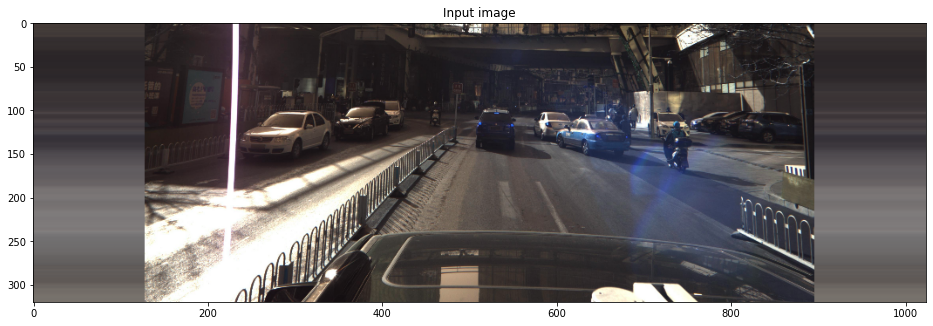

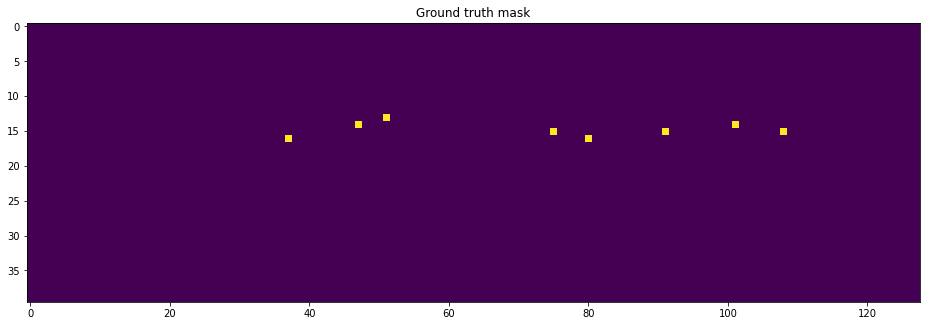

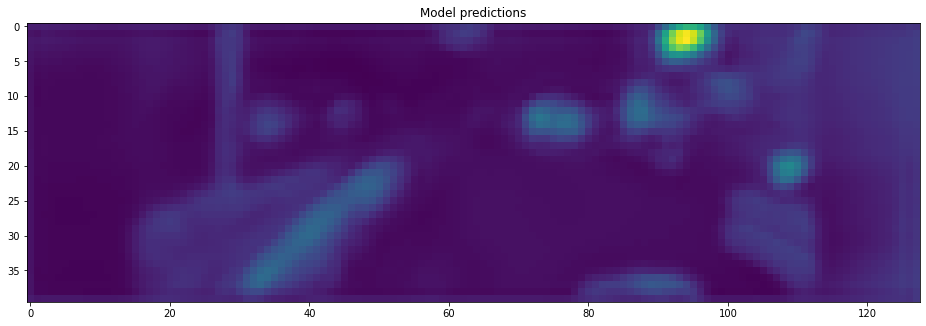

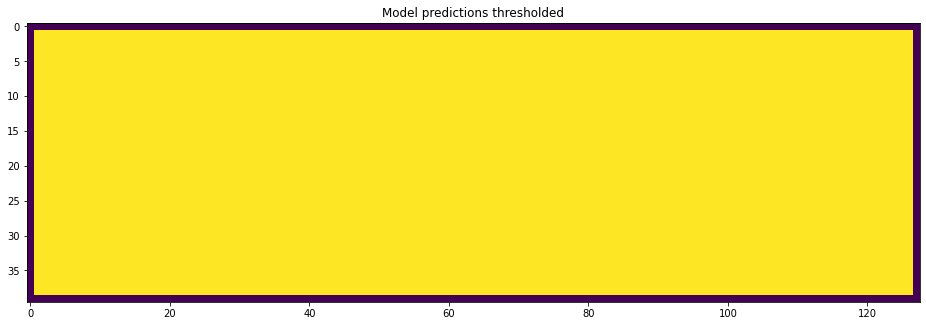

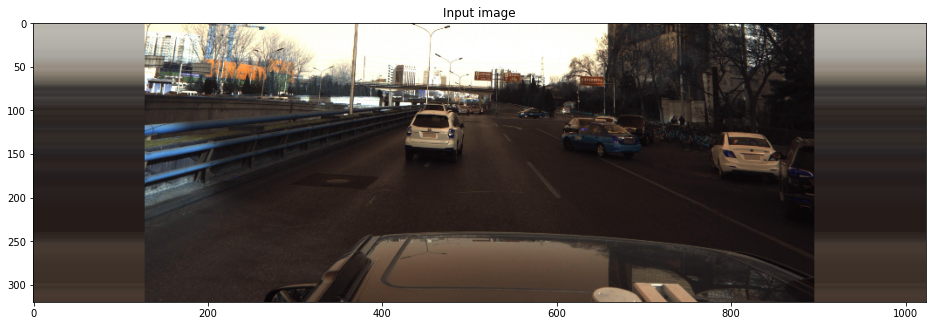

...

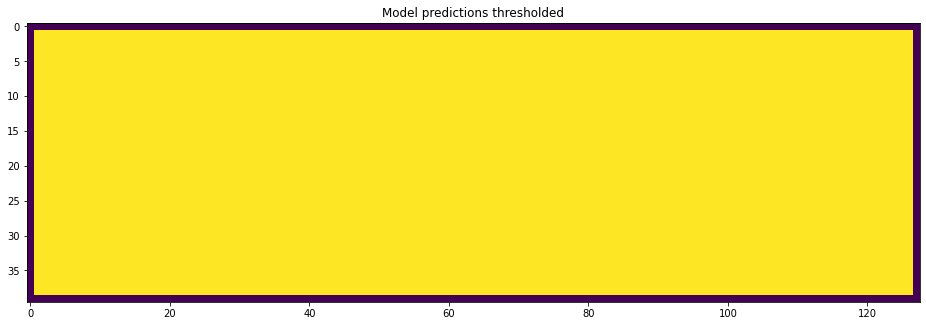

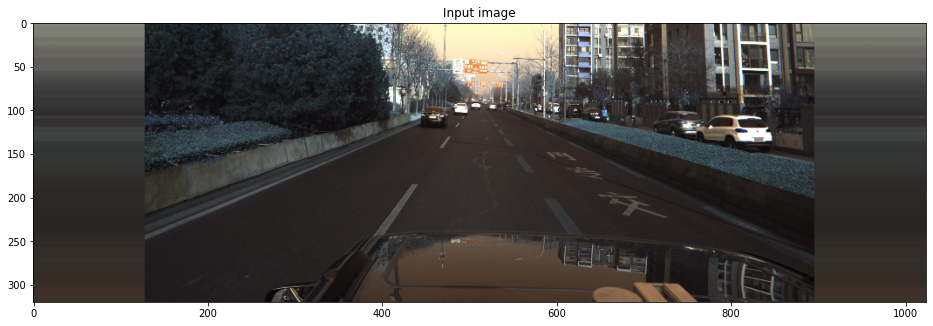

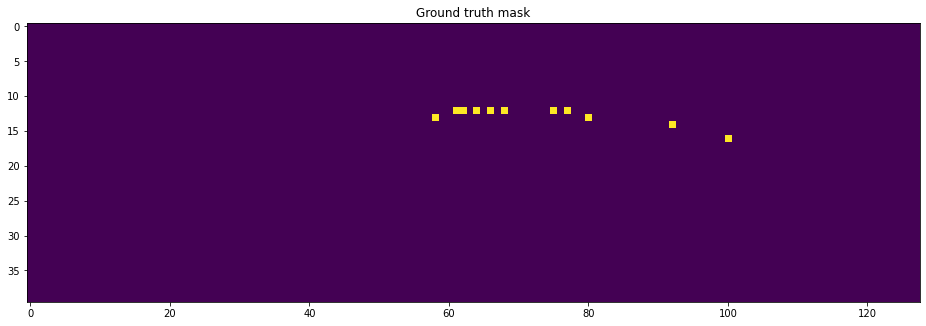

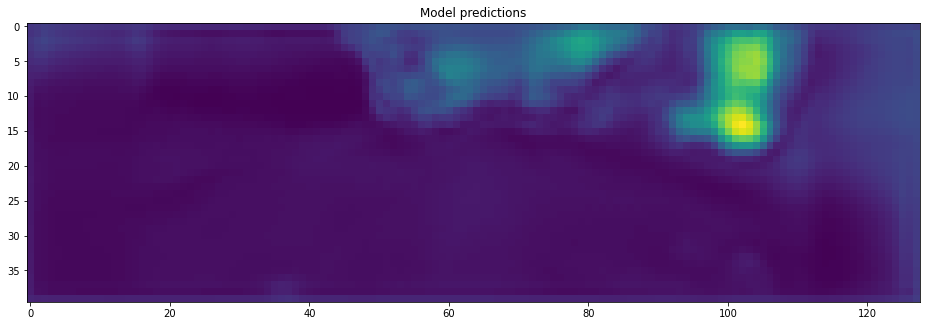

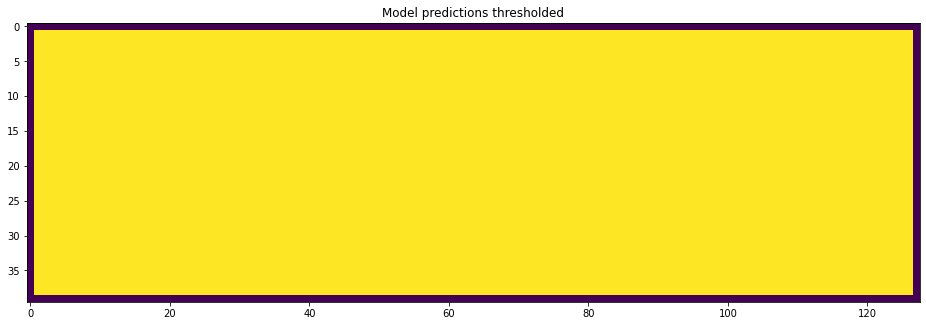

In [55]:
for i in range(30,40):
    img, mask, regr = dev_dataset[i]

    plt.figure(figsize=(16,16))
    plt.title('Input image')
    plt.imshow(np.rollaxis(img, 0, 3))
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Ground truth mask')
    plt.imshow(mask)
    plt.show()

    output = model(torch.tensor(img[None]).to(device))
    logits = output[0,0].data.cpu().numpy()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions')
    plt.imshow(logits)
    plt.show()

    plt.figure(figsize=(16,16))
    plt.title('Model predictions thresholded')
    plt.imshow(peak(logits,-2.5))
    plt.show()

# Make submission

In [124]:
def peak(array, threshold):
    peak_array = np.zeros(array.shape)
    for i in range(1,array.shape[0]-1):
        for j in range(1,array.shape[1]-1):
            value_list = []
            idx = 0 
            if int(array[i,j]>=array[i-1,j])+int(array[i,j]>=array[i+1,j])+\
                    int(array[i,j-1]>=array[i-1,j+1]) >=4:
                if int(array[i,j] >= array[i-1,j-1])+int(array[i,j] >= array[i-1,j+1])+\
                    int(array[i,j] >= array[i+1,j-1])+int(array[i,j] >= array[i+1,j+1])>=3:
                    idx += 1
            if idx==1 and array[i,j]>threshold:
                peak_array[i,j]=1
            if array[i,j]>threshold+2:
                peak_array[i,j]=1
    return peak_array

In [125]:
def extract_coords(prediction, flipped=False):
    logits = peak(prediction[0],-2)
    regr_output = prediction[1:]
    points = np.argwhere(logits > 0)
    col_names = sorted(['x', 'y', 'z', 'yaw', 'pitch_sin', 'pitch_cos', 'roll'])
    coords = []
    for r, c in points:
        regr_dict = dict(zip(col_names, regr_output[:, r, c]))
        coords.append(_regr_back(regr_dict))
        coords[-1]['confidence'] = 1 / (1 + np.exp(-logits[r, c]))
        coords[-1]['x'], coords[-1]['y'], coords[-1]['z'] = \
                optimize_xy(r, c,
                            coords[-1]['x'],
                            coords[-1]['y'],
                            coords[-1]['z'], flipped)
    coords = clear_duplicates(coords)
    return coords

In [127]:
predictions = []

test_loader = DataLoader(dataset=test_dataset, batch_size=4, shuffle=False, num_workers=4)

model.eval()

for img, _, _ in tqdm(test_loader):
    with torch.no_grad():
        output = model(img.to(device))
    output = output.data.cpu().numpy()
    for out in output:
        coords = extract_coords(out)
        s = coords2str(coords)
        predictions.append(s)


  0%|          | 1/506 [00:02<17:00,  2.02s/it]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  0%|          | 2/506 [00:02<13:40,  1.63s/it]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  1%|          | 3/506 [00:03<11:41,  1.39s/it]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  1%|          | 4/506 [00:04<09:50,  1.18s/it]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  1%|          | 5/506 [00:05<09:14,  1.11s/it]/home/dohee/anaconda3/en


  7%|▋         | 36/506 [00:31<06:39,  1.18it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  7%|▋         | 37/506 [00:32<06:32,  1.19it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  8%|▊         | 38/506 [00:33<06:54,  1.13it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  8%|▊         | 39/506 [00:34<06:50,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


  8%|▊         | 40/506 [00:34<06:31,  1.19it/s]/home/dohee/anacond


 14%|█▍        | 71/506 [01:00<06:26,  1.13it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 14%|█▍        | 72/506 [01:01<06:46,  1.07it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 14%|█▍        | 73/506 [01:02<06:51,  1.05it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 15%|█▍        | 74/506 [01:03<06:18,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 15%|█▍        | 75/506 [01:04<06:27,  1.11it/s]/home/dohee/anacond


 21%|██        | 106/506 [01:29<05:09,  1.29it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 21%|██        | 107/506 [01:30<05:14,  1.27it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 21%|██▏       | 108/506 [01:31<05:25,  1.22it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 22%|██▏       | 109/506 [01:32<05:32,  1.19it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 22%|██▏       | 110/506 [01:33<05:20,  1.24it/s]/home/dohee/an


 28%|██▊       | 141/506 [01:59<05:33,  1.09it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 28%|██▊       | 142/506 [02:00<05:17,  1.15it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 28%|██▊       | 143/506 [02:01<05:09,  1.17it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 28%|██▊       | 144/506 [02:02<05:17,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 29%|██▊       | 145/506 [02:02<05:07,  1.18it/s]/home/dohee/an


 35%|███▍      | 176/506 [02:28<05:15,  1.05it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 35%|███▍      | 177/506 [02:29<05:02,  1.09it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 35%|███▌      | 178/506 [02:30<05:20,  1.02it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 35%|███▌      | 179/506 [02:31<04:54,  1.11it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 36%|███▌      | 180/506 [02:31<04:43,  1.15it/s]/home/dohee/an


 42%|████▏     | 211/506 [02:59<04:31,  1.08it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 42%|████▏     | 212/506 [03:00<04:41,  1.04it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 42%|████▏     | 213/506 [03:01<04:24,  1.11it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 42%|████▏     | 214/506 [03:02<04:21,  1.12it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 42%|████▏     | 215/506 [03:03<04:08,  1.17it/s]/home/dohee/an


 49%|████▊     | 246/506 [03:28<03:21,  1.29it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 49%|████▉     | 247/506 [03:29<03:37,  1.19it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 49%|████▉     | 248/506 [03:29<03:16,  1.31it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 49%|████▉     | 249/506 [03:30<03:11,  1.34it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 49%|████▉     | 250/506 [03:31<03:03,  1.39it/s]/home/dohee/an


 56%|█████▌    | 281/506 [03:56<03:22,  1.11it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 56%|█████▌    | 282/506 [03:57<03:12,  1.17it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 56%|█████▌    | 283/506 [03:58<03:09,  1.18it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 56%|█████▌    | 284/506 [03:59<03:11,  1.16it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 56%|█████▋    | 285/506 [04:00<03:03,  1.20it/s]/home/dohee/an


 62%|██████▏   | 316/506 [04:25<02:43,  1.16it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 63%|██████▎   | 317/506 [04:26<02:34,  1.23it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 63%|██████▎   | 318/506 [04:27<02:35,  1.21it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 63%|██████▎   | 319/506 [04:28<02:25,  1.28it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 63%|██████▎   | 320/506 [04:28<02:28,  1.25it/s]/home/dohee/an


 69%|██████▉   | 351/506 [04:54<02:12,  1.17it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 70%|██████▉   | 352/506 [04:55<02:03,  1.25it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 70%|██████▉   | 353/506 [04:55<02:00,  1.27it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 70%|██████▉   | 354/506 [04:56<02:01,  1.25it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 70%|███████   | 355/506 [04:57<02:05,  1.20it/s]/home/dohee/an


 76%|███████▋  | 386/506 [05:23<01:40,  1.19it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 76%|███████▋  | 387/506 [05:23<01:32,  1.29it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 77%|███████▋  | 388/506 [05:25<01:48,  1.08it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 77%|███████▋  | 389/506 [05:25<01:42,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 77%|███████▋  | 390/506 [05:26<01:42,  1.13it/s]/home/dohee/an


 83%|████████▎ | 421/506 [05:52<01:12,  1.17it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 83%|████████▎ | 422/506 [05:53<01:13,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 84%|████████▎ | 423/506 [05:54<01:07,  1.23it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 84%|████████▍ | 424/506 [05:55<01:05,  1.26it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 84%|████████▍ | 425/506 [05:56<01:22,  1.02s/it]/home/dohee/an


 90%|█████████ | 456/506 [06:22<00:46,  1.07it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 90%|█████████ | 457/506 [06:23<00:42,  1.17it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 91%|█████████ | 458/506 [06:24<00:40,  1.20it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 91%|█████████ | 459/506 [06:25<00:41,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 91%|█████████ | 460/506 [06:26<00:40,  1.13it/s]/home/dohee/an


 97%|█████████▋| 491/506 [06:51<00:13,  1.14it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 97%|█████████▋| 492/506 [06:52<00:11,  1.18it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 97%|█████████▋| 493/506 [06:52<00:10,  1.25it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 98%|█████████▊| 494/506 [06:53<00:09,  1.33it/s]/home/dohee/anaconda3/envs/CenterNet/lib/python3.6/site-packages/torch/nn/modules/upsampling.py:122: UserWarning:

nn.Upsampling is deprecated. Use nn.functional.interpolate instead.


 98%|█████████▊| 495/506 [06:54<00:08,  1.26it/s]/home/dohee/an

In [128]:
test = pd.read_csv(PATH + 'sample_submission.csv')
test['PredictionString'] = predictions
test.to_csv('predictions.csv', index=False)
test.head()

,ImageId,PredictionString
0,ID_18fb86d04,
1,ID_ce06d4dc1,0.13945617 0.015141345489828534 -3.09758496482...
2,ID_afe07078f,0.14641643 3.123384713562903 -3.11088514153892...
3,ID_37caf75aa,0.1488688 0.009998686864861434 -3.097189804660...
4,ID_7655363ca,0.14979838 -3.1241732392880164 -3.125052776309...
